In [1]:
import pandas as pd
import numpy as np

In [2]:
df0 = pd.read_csv('https://www.data.gouv.fr/fr/datasets/r/3004168d-bec4-44d9-a781-ef16f41856a2', sep = '|')


# I. Traitement de la base de données

In [3]:
df1 = df0.copy()
pd.set_option('display.max_columns', None)
df1.sample(5)

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
2041937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,31/01/2019,Vente,"294700,00",4.0,NaN,NaN,B018,LES PLAINES DE L AIRE,83470.0,SEILLONS-SOURCE-D ARGENS,83,125,NaN,D,1322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,136.0,5.0,S,NaN,311.0
973678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,18/07/2019,Vente,"80000,00",1.0,NaN,RUE,0016,DU CHATEAU,41120.0,CANDE-SUR-BEUVRON,41,29,NaN,G,1076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,108.0,4.0,S,NaN,164.0
2516147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,08/07/2019,Vente,"770000,00",18.0,NaN,AV,4243,GOURGAUD,75017.0,PARIS 17,75,117,NaN,BE,70,NaN,24,"68,84",37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,73.0,3.0,NaN,NaN,NaN
1809705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,26/12/2019,Vente,"9500000,00",40.0,NaN,RUE,0535,AUGUSTE RISPAL,76600.0,LE HAVRE,76,351,NaN,EC,59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2.0,Appartement,NaN,64.0,3.0,S,NaN,8603.0
393920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,28/02/2019,Vente,"113000,00",3.0,NaN,RUE,0240,HENRI MARC,21800.0,CHEVIGNY-SAINT-SAUVEUR,21,171,NaN,AR,214,NaN,143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN


## 1. Séléction des variables intéressantes

In [4]:
df1.columns

Index(['Code service CH', 'Reference document', '1 Articles CGI',
       '2 Articles CGI', '3 Articles CGI', '4 Articles CGI', '5 Articles CGI',
       'No disposition', 'Date mutation', 'Nature mutation', 'Valeur fonciere',
       'No voie', 'B/T/Q', 'Type de voie', 'Code voie', 'Voie', 'Code postal',
       'Commune', 'Code departement', 'Code commune', 'Prefixe de section',
       'Section', 'No plan', 'No Volume', '1er lot',
       'Surface Carrez du 1er lot', '2eme lot', 'Surface Carrez du 2eme lot',
       '3eme lot', 'Surface Carrez du 3eme lot', '4eme lot',
       'Surface Carrez du 4eme lot', '5eme lot', 'Surface Carrez du 5eme lot',
       'Nombre de lots', 'Code type local', 'Type local', 'Identifiant local',
       'Surface reelle bati', 'Nombre pieces principales', 'Nature culture',
       'Nature culture speciale', 'Surface terrain'],
      dtype='object')

In [5]:
df = df1[[
        'Date mutation', 'Nature mutation', 'Valeur fonciere',
        'No voie', 'Type de voie', 'Code voie', 'Voie', 'Code postal',
        'Commune', 'Code departement', 'Code commune', 'Type local',
        'Surface reelle bati', 'Nombre pieces principales', 'Surface terrain'
        ]]

df.sample(5)

,Date mutation,Nature mutation,Valeur fonciere,No voie,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
1277156,09/02/2019,Vente,"130000,00",1.0,ALL,0471,DES ROSIERS,50580.0,DENNEVILLE,50,160,Maison,61.0,4.0,97.0
1966684,20/08/2019,Vente,"9038,70",NaN,NaN,B062,LA SABLIERE,79210.0,AMURE,79,9,NaN,NaN,NaN,10273.0
1032810,15/11/2019,Vente,"38900,00",NaN,NaN,B009,CHAMBE DE VIN,43450.0,AUTRAC,43,14,NaN,NaN,NaN,2047.0
2177194,14/09/2019,Vente,"156700,00",NaN,NaN,B015,LA CHENAU,88150.0,CAPAVENIR VOSGES,88,465,NaN,NaN,NaN,205.0
2135889,04/06/2019,Vente,"3700,00",NaN,NaN,B068,BONNEUIL,86300.0,VALDIVIENNE,86,233,NaN,NaN,NaN,982.0


### Premier tri pour garder les biens qui nous intéressent dans le cadre que l'on s'est donné

In [6]:
df = df[df['Nature mutation'] == 'Vente']
df = df[df['Code departement'] == 75]
df = df[df['Type local'] == 'Appartement']
df = df[pd.isna(df['Surface terrain'])]

### Changement du nom des variables

In [7]:
df = df[[
        'Date mutation', 'Valeur fonciere', 'No voie', 
        'Type de voie', 'Voie', 'Code postal', 'Surface reelle bati', 
        'Nombre pieces principales',
        'Code departement', 'Code commune', 'Code voie',
        'Type local'
        ]]

df = df.rename(columns = {
                            'Date mutation': 'Date', 
                            'Valeur fonciere': 'Valeur',
                            'Type de voie': 'TypeVoie',
                            'No voie': 'Numero',
                            'Code postal': 'CodePostal',
                            'Surface reelle bati': 'Surface',
                            'Nombre pieces principales': 'NbPieces',
                            'Surface terrain': 'SurfaceTerrain',
                            'Code departement': 'Code_departement', 
                            'Code commune': 'Code_commune', 
                            'Code voie': 'Code_voie',
                            'Type local': 'TypeLocal'
                         }
              )

## 2. Gestion des variables

In [8]:
df.dtypes

Date                 object
Valeur               object
Numero              float64
TypeVoie             object
Voie                 object
CodePostal          float64
Surface             float64
NbPieces            float64
Code_departement     object
Code_commune          int64
Code_voie            object
TypeLocal            object
dtype: object

On remarque que la variable "Valeur" n'est pas de type str, il va falloir y remédier !

### Valeur

In [9]:
# Les biens dont la valeur n'est pas renseignée ne nous intéressent pas
df = df.dropna(subset = ['Valeur'])

# Changement des virgules en point pour pouvoir convertir les types str en types float
df['Valeur'] = df.apply(lambda row : str(row.Valeur).replace(',', '.'), axis = 1)
df['Valeur'] = pd.to_numeric(df['Valeur'])

# On divise par 1 million les prix pour plus de lisibilité
df['Valeur'] = df['Valeur']/1000000

# Valeurs abérrantes et focus sur une certaine tranche de prix "raisonnable"
df = df[df['Valeur'] > .01]
df = df[df['Valeur'] < 2]

In [10]:
df.sort_values('Valeur', ascending = False).head()

,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,Code_departement,Code_commune,Code_voie,TypeLocal
2485347,18/07/2019,1.994440,6.0,RUE,DE L ECHAUDE,75006.0,90.0,3.0,75,106,3080,Appartement
2518164,04/11/2019,1.991500,98.0,RUE,PIERRE DEMOURS,75017.0,164.0,5.0,75,117,7426,Appartement
2522902,17/07/2019,1.986222,8.0,BD,DE CLICHY,75018.0,24.0,1.0,75,118,2113,Appartement
2522911,17/07/2019,1.986222,8.0,BD,DE CLICHY,75018.0,21.0,1.0,75,118,2113,Appartement
2522924,17/07/2019,1.986222,8.0,BD,DE CLICHY,75018.0,17.0,1.0,75,118,2113,Appartement


### Date

In [11]:
display(df.sort_values('Date')[['Date']])
df[pd.isna(df['Date'])].shape

# Il ne semble pas y avoir de valeurs manquantes

,Date
2526131,01/02/2019
2501071,01/02/2019
2513992,01/02/2019
2514010,01/02/2019
2501092,01/02/2019
...,...
2507344,31/12/2019
2525577,31/12/2019
2507238,31/12/2019
2519046,31/12/2019


(0, 12)

### Elements d'adresse (Numero, TypeVoie,  Voie, CodePostal)

In [12]:
# Numero
print(df[pd.isna(df['Numero'])].shape)

# 10 lignes sans numéro, on les supprime car on souhaite une localisation précise des appartements

df = df.dropna(subset = ['Numero'])

(0, 12)


In [13]:
# TypeVoie

print(df[pd.isna(df['TypeVoie'])].shape)

# 15 valeurs manquantes, on regarde à quoi elles correspondent

display(df[pd.isna(df['TypeVoie'])])

# Cela correspond à des adresses où le type de voie est spécial (Villa, Pont, Autoroute, Rond point) 
# et est contenu dans la variable Voie
# On laisse comme ca

(15, 12)


,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,Code_departement,Code_commune,Code_voie,TypeLocal
2478666,28/02/2019,0.42970,30.0,NaN,VIL WAGRAM SAINT HONORE,75008.0,41.0,1.0,75,108,9936,Appartement
2495603,03/06/2019,0.89660,3.0,NaN,N 11,75011.0,100.0,3.0,75,111,X421,Appartement
2500112,03/07/2019,0.21700,4.0,NaN,ALLEE DES HORTENSIAS,75014.0,18.0,1.0,75,114,R072,Appartement
2501436,14/02/2019,0.33970,3.0,NaN,VLA HONORE GABRIEL RIQUETI,75015.0,31.0,1.0,75,115,4648,Appartement
2501524,13/02/2019,0.25000,6.0,NaN,VIL DU MONT TONNERRE,75015.0,25.0,1.0,75,115,6539,Appartement
2501686,13/02/2019,0.97000,7.0,NaN,DU PONT MIRABEAU,75015.0,120.0,4.0,75,115,7616,Appartement
2502474,15/04/2019,0.30906,3.0,NaN,VIL DU MONT TONNERRE,75015.0,21.0,2.0,75,115,6539,Appartement
2503541,10/05/2019,0.85600,9003.0,NaN,METRO BOUCICAUT,75015.0,78.0,4.0,75,115,S049,Appartement
2504640,12/07/2019,0.86000,7.0,NaN,VLA HONORE GABRIEL RIQUETI,75015.0,80.0,3.0,75,115,4648,Appartement
2504703,16/07/2019,0.57000,158.0,NaN,R-PTSAINT CHARLES,75015.0,70.0,2.0,75,115,8512,Appartement


In [14]:
# Voie
display(df.sort_values('Voie')[['Voie']])
print(df[pd.isna(df['Voie'])].shape)

# Il ne semble pas y avoir de valeurs manquantes

,Voie
2493978,A 11
2528149,AB 20
2532159,AB 20
2494739,ABEL
2497687,ABEL HOVELACQUE
...,...
2522590,YVONNE LE TAC
2522973,YVONNE LE TAC
2520758,YVONNE LE TAC
2520910,YVONNE LE TAC


(0, 12)


In [15]:
# CodePostal

print(df[pd.isna(df['CodePostal'])].shape)

# 1 valeur manquante, on regarde à quoi elle correspond

display(df[pd.isna(df['CodePostal'])])

# La rue de l'Abbé Groult se situe dans le 15ème, on remplit à la main

df.at[2503844, 'CodePostal'] = float(75015)

display(df.loc[[2503844]])

(1, 12)


,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,Code_departement,Code_commune,Code_voie,TypeLocal
2503844,23/05/2019,0.15,23.0,RUE,DE L ABBE GROULT,NaN,19.0,1.0,75,115,0012,Appartement


,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,Code_departement,Code_commune,Code_voie,TypeLocal
2503844,23/05/2019,0.15,23.0,RUE,DE L ABBE GROULT,75015.0,19.0,1.0,75,115,0012,Appartement


### NbPieces

In [16]:
print(df[pd.isna(df['NbPieces'])].shape)

display(df.sort_values('NbPieces')[['NbPieces']])

# Pas de valeurs manquantes mais des appartements à 0 pièces...

display(df[df['NbPieces'] == 0])

# Les entrées n'ont pas l'air des anomalies, la valeur doit être manquante, on laisse tel quel

(0, 12)


,NbPieces
2490379,0.0
2488012,0.0
2525694,0.0
2513217,0.0
2535490,0.0
...,...
2492176,11.0
2481821,11.0
2508858,12.0
2499993,20.0


,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,Code_departement,Code_commune,Code_voie,TypeLocal
2479736,17/06/2019,0.346750,10.0,RUE,SAINTE ANASTASE,75003.0,29.0,0.0,75,103,8531,Appartement
2480202,12/07/2019,0.120000,17.0,BD,SAINT MARTIN,75003.0,18.0,0.0,75,103,8692,Appartement
2480249,02/07/2019,0.342500,22.0,RUE,DE PICARDIE,75003.0,12.0,0.0,75,103,7395,Appartement
2482477,17/12/2019,0.774600,6.0,RUE,SAINT FLORENTIN,75001.0,18.0,0.0,75,101,8611,Appartement
2483400,12/03/2019,0.169850,54.0,RUE,HENRI BARBUSSE,75005.0,31.0,0.0,75,105,4535,Appartement
2483425,27/02/2019,0.750000,33.0,AV,DUQUESNE,75007.0,18.0,0.0,75,107,3023,Appartement
2484595,21/05/2019,0.276914,61.0,AV,DE SEGUR,75007.0,23.0,0.0,75,107,8909,Appartement
2484598,06/06/2019,0.620000,4.0,RUE,DU GAL CAMOU,75007.0,14.0,0.0,75,107,4022,Appartement
2485652,18/07/2019,0.295000,66.0,AV,DE BRETEUIL,75007.0,25.0,0.0,75,107,1277,Appartement
2485917,06/09/2019,0.285000,14.0,RUE,PESTALOZZI,75005.0,22.0,0.0,75,105,7301,Appartement


### Surface

Un logement mis en location doit respecter une surface minimum. Il s'agit d'un des critères de décence du logement.

Le logement doit comporter au moins une pièce principale présentant :

une surface habitable de 9 m² et une hauteur sous plafond minimale de 2,20 mètres,
ou un volume habitable de 20 m³.

In [17]:
df = df[df['Surface'] >= 9]

### Création de la variable 'id' qui permettra d'identifier l'adresse précise dans une autre bdd

In [18]:
df.columns

def code_numero(numero):
    """Créé le code utilisé pour identifier le numero d'une rue au sein du code 'id' 

    Argument :
    numero : float
        numero de la rue tel que présent dans la base de données

    Return :
    code : str
        Le code correspondant (format 00007 pour le numéro 7 d'une rue, par exemple)
    """

    code = str(int(numero))
    code = '0' * (5 - len(code)) + code

    return code

df['id'] = df['Code_departement'].astype(str) + df['Code_commune'].astype(str) + '_' + df['Code_voie'].astype(str) + '_' + df['Numero'].apply(code_numero)

df = df.drop(columns = ['Code_commune', 'Code_departement', 'Code_voie'])

# Vérification

df.head(5)

,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,TypeLocal,id
2478017,04/01/2019,1.19600,17.0,RUE,DUPHOT,75001.0,112.0,3.0,Appartement,75101_2999_00017
2478018,03/01/2019,1.57049,13.0,RUE,DE THORIGNY,75003.0,104.0,3.0,Appartement,75103_9298_00013
2478022,10/01/2019,0.23000,4.0,RUE,BLONDEL,75003.0,26.0,1.0,Appartement,75103_1021_00004
2478024,05/01/2019,0.95575,82.0,BD,MALESHERBES,75008.0,80.0,3.0,Appartement,75108_5951_00082
2478025,07/01/2019,0.50680,4.0,CITE,DUPETIT THOUARS,75003.0,45.0,2.0,Appartement,75103_2996_00004


In [19]:
# Petite sauvegadre de la base à ce stade

dfv0 = df.copy()

## 3. Gestion des anomalies

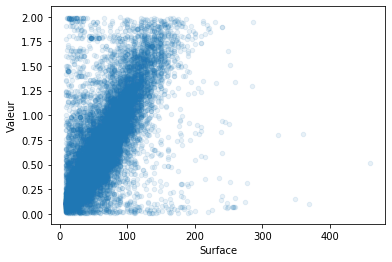

In [25]:
# On peut déjà tracer le prix en fonction de la surface, on voit grossièrement une relation linéaire apparaitre
# Problème : présence de beaucoup de petits biens très chers (en haut à gauche sur le graphe)

df.plot(x = 'Surface', y = 'Valeur', kind = 'scatter', alpha = .1)

In [21]:
# Exemple d'anomalie détectée "à la main"

df0.iloc[[i for i in range(2522894,2522899)]]

# Les ventes semblent être les mêmes (l'adresse est exactement la même) et pourtant on a plusieurs lignes

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
2522894,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,17/07/2019,Vente,"1986222,00",8.0,NaN,BD,2113,DE CLICHY,75018.0,PARIS 18,75,118,NaN,BQ,113,NaN,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,24.0,1.0,NaN,NaN,NaN
2522895,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,17/07/2019,Vente,"1986222,00",8.0,NaN,BD,2113,DE CLICHY,75018.0,PARIS 18,75,118,NaN,BQ,113,NaN,36,NaN,37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,25.0,2.0,NaN,NaN,NaN
2522896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,17/07/2019,Vente,"1986222,00",8.0,NaN,BD,2113,DE CLICHY,75018.0,PARIS 18,75,118,NaN,BQ,113,NaN,13,NaN,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,35.0,2.0,NaN,NaN,NaN
2522897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,17/07/2019,Vente,"1986222,00",8.0,NaN,BD,2113,DE CLICHY,75018.0,PARIS 18,75,118,NaN,BQ,113,NaN,18,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,35.0,2.0,NaN,NaN,NaN
2522898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,17/07/2019,Vente,"1986222,00",8.0,NaN,BD,2113,DE CLICHY,75018.0,PARIS 18,75,118,NaN,BQ,113,NaN,48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,24.0,1.0,NaN,NaN,NaN


In [57]:
# Deuxième type d'erreur
df0.iloc[[i for i in range(2510317,2510319)]]

# Les deux ventes semblent être les mêmes mais le numero de voie n'est pas le même (6 et 8 avenue du Gal Balfourier)

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
2510317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,07/06/2019,Vente,"1422500,00",8.0,NaN,AV,4012,DU GAL BALFOURIER,75016.0,PARIS 16,75,116,NaN,AO,2,NaN,1736,NaN,1737,NaN,1932,NaN,1941.0,NaN,NaN,NaN,4,2.0,Appartement,NaN,120.0,4.0,NaN,NaN,NaN
2510318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,07/06/2019,Vente,"1422500,00",6.0,NaN,AV,4012,DU GAL BALFOURIER,75016.0,PARIS 16,75,116,NaN,AO,2,NaN,1738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,9.0,1.0,NaN,NaN,NaN


Pour remédier au problème, on créé une variable Tracker qui permettra de mieux repérer ces anomalies
### Création de la variable Tracker

In [27]:
df['Tracker'] = df.apply(
                                lambda row: '|'.join([
                                                        row.Date, 
                                                        str(row.Valeur), 
                                                        str(row.TypeVoie), 
                                                        str(row.Voie)
                                                    ]), 
                               axis = 1
                              ) 

In [28]:
# Vérification de l'existence de ces anomalies

print(
        df['Tracker'].shape,
        pd.unique(df['Tracker']).shape
    )

# Environ 1 500 lignes sont conernées (5% de la base)

(30286,) (28733,)


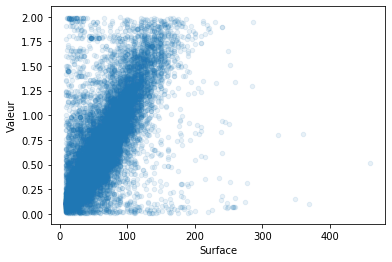

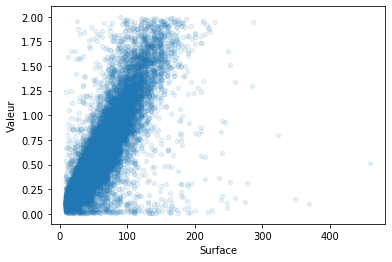

In [29]:
# Suppression de ces anomalies

df = df.drop_duplicates('Tracker', keep = False)

# Le graphe est un peu plus propre (partie en haut à gauche moins importante)

dfv0.plot(x = 'Surface', y = 'Valeur', kind = 'scatter', alpha = .1)
df.plot(x = 'Surface', y = 'Valeur', kind = 'scatter', alpha = .1)

In [30]:
# Detection des anomalies

df[df['Valeur'] < .25].sort_values('Surface', ascending = False).head(10)

,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,TypeLocal,id,Tracker
2535481,19/11/2019,0.100,48.0,RUE,DE RIVOLI,75004.0,370.0,9.0,Appartement,75104_8249_00048,19/11/2019|0.1|RUE|DE RIVOLI
2508962,05/04/2019,0.149,9.0,RUE,MICHEL ANGE,75016.0,348.0,8.0,Appartement,75116_6324_00009,05/04/2019|0.149|RUE|MICHEL ANGE
2480342,04/07/2019,0.120,19.0,AV,GEORGE V,75008.0,275.0,5.0,Appartement,75108_4110_00019,04/07/2019|0.12|AV|GEORGE V
2508061,20/02/2019,0.160,19.0,BD,DELESSERT,75016.0,260.0,7.0,Appartement,75116_2674_00019,20/02/2019|0.16|BD|DELESSERT
2518552,09/12/2019,0.063,4.0,RUE,EDOUARD DETAILLE,75017.0,248.0,7.0,Appartement,75117_3142_00004,09/12/2019|0.063|RUE|EDOUARD DETAILLE
2516790,02/08/2019,0.110,4.0,RUE,EDOUARD DETAILLE,75017.0,248.0,7.0,Appartement,75117_3142_00004,02/08/2019|0.11|RUE|EDOUARD DETAILLE
2514855,19/02/2019,0.185,151.0,AV,DE WAGRAM,75017.0,240.0,7.0,Appartement,75117_9933_00151,19/02/2019|0.185|AV|DE WAGRAM
2507997,19/02/2019,0.140,14.0,BD,EMILE AUGIER,75016.0,239.0,8.0,Appartement,75116_3207_00014,19/02/2019|0.14|BD|EMILE AUGIER
2478714,15/03/2019,0.040,2.0,RUE,DE BEAUCE,75003.0,225.0,6.0,Appartement,75103_0761_00002,15/03/2019|0.04|RUE|DE BEAUCE
2483967,05/04/2019,0.020,10.0,RUE,DE SEINE,75006.0,220.0,6.0,Appartement,75106_8913_00010,05/04/2019|0.02|RUE|DE SEINE


In [31]:
# Detection des anomalies

df0.iloc[[i for i in range(2507993,2508000)]]

# En général : PRESENECE DUNE DEPENDANCE

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
2507993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,20/02/2019,Vente,"37000,00",30.0,NaN,RUE,3545,FELICIEN DAVID,75016.0,PARIS 16,75,116,NaN,BY,24,NaN,102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
2507994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,08/02/2019,Vente,"189000,00",5.0,NaN,RUE,6381,MIRABEAU,75016.0,PARIS 16,75,116,NaN,AK,32,NaN,27,"13,80",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,13.0,1.0,NaN,NaN,NaN
2507995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,13/02/2019,Vente,"19000,00",19.0,NaN,RUE,5603,LEROUX,75016.0,PARIS 16,75,116,NaN,FD,10,NaN,112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
2507996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,19/02/2019,Vente,"140000,00",14.0,NaN,BD,3207,EMILE AUGIER,75016.0,PARIS 16,75,116,NaN,DM,19,NaN,31,"11,60",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
2507997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,19/02/2019,Vente,"140000,00",14.0,NaN,BD,3207,EMILE AUGIER,75016.0,PARIS 16,75,116,NaN,DM,19,NaN,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,239.0,8.0,NaN,NaN,NaN
2507998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,12/02/2019,Vente,"647000,00",34.0,NaN,RUE,0594,D AUTEUIL,75016.0,PARIS 16,75,116,NaN,BQ,91,NaN,1,"122,61",2,NaN,8,NaN,NaN,NaN,NaN,NaN,3,4.0,Local industriel. commercial ou assimilé,NaN,176.0,0.0,NaN,NaN,NaN
2507999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,25/01/2019,Vente,"864000,00",114.0,NaN,QUAI,5766,LOUIS BLERIOT,75016.0,PARIS 16,75,116,NaN,AJ,15,NaN,673,"95,15",674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,94.0,4.0,NaN,NaN,NaN


In [32]:
# df = df.drop(columns = 'Tracker')

# Couplage avec la base des données GPS

### [EXPLICATIONS]

In [33]:
df2 = pd.read_csv('https://adresse.data.gouv.fr/data/ban/adresses/latest/csv/adresses-75.csv.gz', sep = ';').copy()

In [34]:
pd.set_option('display.max_columns', None)
df2.sample(5)

,id,id_fantoir,numero,rep,nom_voie,code_postal,code_insee,nom_commune,code_insee_ancienne_commune,nom_ancienne_commune,x,y,lon,lat,alias,nom_ld,libelle_acheminement,nom_afnor,source_position,source_nom_voie
96957,75118_0517_00183,75118_0517,183,NaN,Rue d'Aubervilliers,75018,75118,Paris 18e Arrondissement,NaN,NaN,653847.34,6866435.27,2.370506,48.896269,NaN,NaN,PARIS,RUE D AUBERVILLIERS,commune,commune
127052,75113_5113_00002_u,75113_5113,2,u,Rue Julie Daubié,75013,75113,Paris 13e Arrondissement,NaN,NaN,654450.72,6858729.22,2.379561,48.827012,NaN,NaN,PARIS,RUE JULIE DAUBIE,commune,commune
145866,75115_9115_00008,75115_9115,8,NaN,Port de Suffren,75015,75115,Paris 15e Arrondissement,NaN,NaN,647847.35,6862035.26,2.289214,48.856242,NaN,NaN,PARIS,PORT DE SUFFREN,commune,commune
43830,75111_6601_00031,75111_6601,31,NaN,Rue du Moulin Joly,75011,75111,Paris 11e Arrondissement,NaN,NaN,654368.08,6863515.95,2.377922,48.870053,NaN,NaN,PARIS,RUE DU MOULIN JOLY,commune,commune
120638,75120_0832_00082,75120_0832,82,NaN,Boulevard de Belleville,75020,75120,Paris 20e Arrondissement,NaN,NaN,654505.78,6863506.06,2.379800,48.869974,NaN,NaN,PARIS,BOULEVARD DE BELLEVILLE,commune,commune


### Séléction des variables intéressantes

In [35]:
df_GPS = df2[[
        'id', 'x', 'y', 'lon', 'lat', 
        ]]

df_GPS.sample(10)

,id,x,y,lon,lat
45773,75111_9055_00002,655156.21,6861479.55,2.388881,48.851795
123382,75113_0735_00009,653154.27,6858582.88,2.361919,48.825603
87458,75118_1992_00009,652071.91,6865460.90,2.346401,48.887377
77613,75117_7766_00043,650152.26,6866187.13,2.320139,48.893762
50845,75112_6495_00004,654967.48,6860473.61,2.386415,48.842736
36382,75108_0900_00016,650374.93,6864752.96,2.323344,48.880882
69550,75119_8241_00048,653878.74,6865674.51,2.371017,48.889429
32413,75110_1123_00006,652496.51,6864459.29,2.352304,48.878401
30741,75110_0249_00040,652959.54,6864477.04,2.358615,48.878595
136560,75115_5456_00105,648850.12,6860510.66,2.303064,48.842612


### Couplage avec df

In [36]:
print(df.shape)
df = df.merge(df_GPS, left_on = 'id', right_on = 'id')
print(df.shape)

df = df.drop(columns = 'Tracker')

display(df.sample(10))

(27450, 11)
(27374, 15)


,Date,Valeur,Numero,TypeVoie,Voie,CodePostal,Surface,NbPieces,TypeLocal,id,x,y,lon,lat
5105,05/06/2019,0.46800,8.0,RUE,DE L AGENT BAILLY,75009.0,43.0,1.0,Appartement,75109_0090_00008,651705.70,6864482.94,2.341519,48.878555
10071,06/06/2019,0.72000,22.0,RUE,DE PLAISANCE,75014.0,64.0,1.0,Appartement,75114_7510_00022,650038.39,6859408.53,2.319383,48.832794
10297,26/07/2019,0.20650,127.0,AV,DU GENERAL LECLERC,75014.0,23.0,1.0,Appartement,75114_4063_00127,650503.17,6858374.30,2.325835,48.823529
7193,14/03/2019,0.59300,1.0,RUE,JEAN MACE,75011.0,54.0,3.0,Appartement,75111_4913_00001,654828.33,6861589.58,2.384401,48.852762
11996,11/09/2019,0.50000,16.0,RUE,GASTON DE CAILLAVET,75015.0,57.0,2.0,Appartement,75115_3974_00016,647481.19,6861231.11,2.284324,48.848981
14490,20/06/2019,0.40247,22.0,RUE,JOUVENET,75016.0,35.0,2.0,Appartement,75116_5042_00022,646080.59,6860546.45,2.265326,48.842708
19900,09/12/2019,0.45000,74.0,RUE,VAUVENARGUES,75018.0,48.0,3.0,Appartement,75118_9628_00074,650880.09,6866537.02,2.330025,48.896964
16867,22/02/2019,0.30100,18.0,RUE,EMILE LEVEL,75017.0,36.0,2.0,Appartement,75117_3246_00018,650021.08,6866115.49,2.318359,48.893107
8202,18/01/2019,0.89000,121.0,AV,D ITALIE,75013.0,140.0,5.0,Appartement,75113_4754_00121,652945.79,6858176.46,2.359124,48.821933
4878,26/04/2019,0.22500,60.0,AV,CLAUDE VELLEFAUX,75010.0,24.0,1.0,Appartement,75110_2088_00060,653826.64,6864235.35,2.370463,48.876484


On perd à peine une centaine de lignes

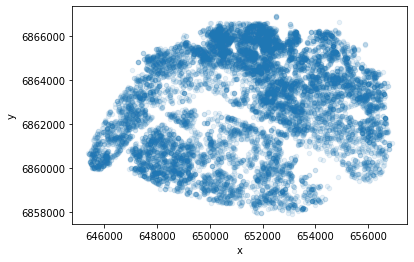

In [44]:
df.sample(15000).plot(x = 'x', y = 'y', kind = 'scatter', alpha = .1)